**Resources:** https://github.com/keras-team/keras-io/blob/master/examples/generative/cyclegan.py   (CYCLEGAN)<br>
**Datasets:** https://efrosgans.eecs.berkeley.edu/cyclegan/datasets/
    (vangogh2photo)<br>

Tarih: 15.05.2024

## CycleGAN NEDİR?

CycleGAN, bir tür Generative Adversarial Network (GAN) olup, bir görüntüden diğerine tarz transferi yapma yeteneği ile bilinir. Özellikle, etiketlenmemiş görüntüler arasında stili dönüştürmek için kullanılır. Örneğin, yaz manzaralarını kış manzaralarına veya atları zebra desenlerine dönüştürebilir. 2017 yılında Jun-Yan Zhu ve diğerleri tarafından geliştirilmiştir.

CycleGAN iki temel bileşenden oluşur: iki ayrı GAN yapılandırması. Her biri bir stil transfer yönünü öğrenmek için kullanılır. Birinci GAN, kaynak görüntüyü hedef görüntü stilinde yeniden oluşturmayı hedeflerken, ikinci GAN, yeniden oluşturulan görüntüyü orijinal kaynak görüntü stiline geri dönüştürmeyi hedefler. Bu süreç, "döngü tutarlılığı" olarak bilinen bir kısıtlama ile desteklenir, yani bir görüntü stil değiştirdikten sonra orijinal görüntüye geri dönüştürüldüğünde, başlangıçtaki görüntüyle aynı olmalıdır.

Bu model, çift yönlü yapıda olduğundan ve döngüsel bir tutarlılık kaybı kullanarak eğitildiğinden, etiketlenmiş verilere olan ihtiyacı azaltır ve stil transferi gibi görevlerde oldukça etkili bir çözüm sunar. CycleGAN, fotoğraf gerçekçiliğini korurken, bir stilden diğerine güçlü dönüşümler yapabilme kapasitesi ile dikkat çeker.

Projende CycleGAN'ı tanıtmak, özellikle bu teknolojinin potansiyel uygulamalarını ve nasıl çalıştığını anlamak açısından faydalı olacaktır. Ayrıca, bu modelin nasıl bir veri seti ile eğitildiği ve hangi tür problemlerde kullanılabileceği üzerinde durmak, dinleyicilere daha derinlemesine bir bakış açısı sunabilir.


- [Paper](https://arxiv.org/pdf/1703.10593.pdf)
- [Original implementation](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix)

## Kurulum

In [1]:
!pip install tensorflow_addons
!pip install tensorflow_datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 4.4 MB/s eta 0:00:00


In [2]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## Dataseti uygun hale getir

Bu örnekte,
[Van Gogh to Fotoğraf](https://www.tensorflow.org/datasets/catalog/cycle_gan?hl=tr#cycle_ganvangogh2photo)
datasetini kullanacağız.

In [3]:
# Van Gogh ve Fotoğraf veri setini tensorflow-datasets kullanarak yükle.
dataset, _ = tfds.load("cycle_gan/vangogh2photo", with_info=True, as_supervised=True)
train_goghs, train_photos = dataset["trainA"], dataset["trainB"]
test_goghs, test_photos = dataset["testA"], dataset["testB"]

# Standart resim boyutunu tanımla.
orig_img_size = (286, 286)
# Eğitim sırasında kullanılacak rastgele kırpma boyutları.
input_img_size = (256, 256, 3)
# Katmanlar için ağırlık başlatıcısı.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Örnek normalleştirme için gamma başlatıcısı.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Değerleri [-1, 1] aralığına eşle.
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Rastgele yatay çevirme
    img = tf.image.random_flip_left_right(img)
    # İlk önce orijinal boyuta yeniden boyutlandır
    img = tf.image.resize(img, [*orig_img_size])
    # 256X256 boyutunda rastgele kırp
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Piksel değerlerini [-1, 1] aralığında normalize et
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Test resimleri için sadece yeniden boyutlandırma ve normalizasyon.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img


Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0. Subsequent calls will reuse this data.


## Ön işleme işlemlerini uygula


In [4]:
# Eğitim veri setindeki Gogh resimlerine ön işleme işlemlerini uygula
train_goghs = (
    train_goghs.map(preprocess_train_image, num_parallel_calls=autotune)  # Ön işleme fonksiyonunu paralel olarak uygula
    .cache()  # İşlenmiş verileri önbelleğe al
    .shuffle(buffer_size)  # Veriyi karıştır
    .batch(batch_size)  # Veriyi belirtilen parti boyutunda grupla
)

train_photos = (
    train_photos.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

test_goghs = (
    test_goghs.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

test_photos = (
    test_photos.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)


## Bazı örnekleri göster



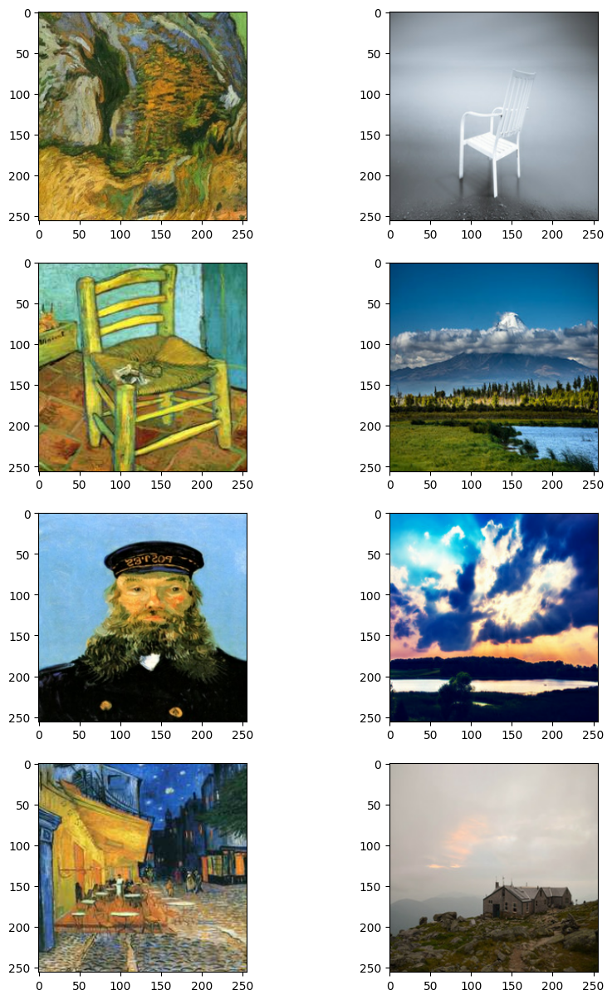

In [5]:

_, ax = plt.subplots(4, 2, figsize=(10, 15))  # 4 satır ve 2 sütundan oluşan bir figür oluştur
for i, samples in enumerate(zip(train_goghs.take(4), train_photos.take(4))):  # Eğitim verisinden 4 örnek al ve döngüye sok
    gogh = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)  # Gogh resmini normalize edilmiş halden gerçek resim formatına çevir
    photo = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)  # Fotoğrafı normalize edilmiş halden gerçek resim formatına çevir
    ax[i, 0].imshow(gogh)  # Gogh resmini ilgili subplot'a çiz
    ax[i, 1].imshow(photo)  # Fotoğrafı ilgili subplot'a çiz
plt.show()  # Figürü göster


## CycleGAN üreteçlerinde ve ayırıcılarında kullanılan yapı taşları

In [6]:
class ReflectionPadding2D(layers.Layer):
    """Yansıma Dolgusu katmanını gerçekleştirir. Bu katman, kenar bölgelerinde oluşabilecek artefaktları (kırılmaları) azaltmak için kullanılır.
    Convolution işleminden önce kullanılır.

    Argümanlar:
        padding (tuple): Uzamsal boyutlar için dolgu miktarı (yükseklik, genişlik).

    Geri Dönüş:
        Girdi tensoru ile aynı türde, dolgulu bir tensor döndürür.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    """Katmanda arta kalan blok (residual block) oluşturur, bu bloklar modelin daha derin olmasına rağmen eğitilmesini kolaylaştırır.

    Katman, giriş tensorüne eşit boyutta çıkış üretir ve son çıkış, giriş tensorü ile element bazında toplanarak elde edilir. Bu işlem sayesinde gradyanların derin ağlarda kaybolması problemi azaltılır.

    Argümanlar:
        x (Tensor): Girdi tensoru.
        activation (fonksiyon): Aktivasyon fonksiyonu.
        kernel_initializer (keras.initializers): Kernel başlatıcı.
        kernel_size (tuple): Convolution kernel boyutu.
        strides (tuple): Convolution adım boyutu.
        padding (str): Padding tipi ('valid' ya da 'same').
        gamma_initializer (keras.initializers): Gamma başlatıcı.
        use_bias (bool): Bias kullanılıp kullanılmayacağı.
    """
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor) # Yansıma dolgusu uygula
    x = layers.Conv2D( # İlk evrişim katmanı
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(x) # Instance normalization uygula
    x = activation(x) # Aktivasyon fonksiyonunu uygula

    x = ReflectionPadding2D()(x) # Yansıma dolgusu uygula
    x = layers.Conv2D( # İkinci evrişim katmanı
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(x) # Instance normalization uygula
    x = layers.add([input_tensor, x]) # Giriş tensorü ile çıkışı topla
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


## Build the generators

The generator consists of downsampling blocks: nine residual blocks
and upsampling blocks. The structure of the generator is the following:

```
c7s1-64 ==> Conv block with `relu` activation, filter size of 7
d128 ====|
         |-> 2 downsampling blocks
d256 ====|
R256 ====|
R256     |
R256     |
R256     |
R256     |-> 9 residual blocks
R256     |
R256     |
R256     |
R256 ====|
u128 ====|
         |-> 2 upsampling blocks
u64  ====|
c7s1-3 => Last conv block with `tanh` activation, filter size of 7.
```

In [7]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    # Giriş katmanını oluştur, resim boyutu sabit.
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Aşağı örnekleme blokları (Downsampling)
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Artık (Residual) bloklar
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Yukarı örnekleme blokları (Upsampling)
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Çıkış katmanı, son blok
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    # Modeli oluştur ve döndür
    model = keras.models.Model(img_input, x, name=name)
    return model


## Ayırt edicileri (Discriminators) oluştur

Ayırıcılar, aşağıdaki mimariyi uygular:
`C64->C128->C256->C512`

In [8]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    # Giriş katmanını oluştur, resim boyutu sabit.
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    # Aşağı örnekleme bloklarını tanımla
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    # Çıkış katmanını ekle
    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    # Modeli oluştur ve döndür
    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Jeneratörler oluşturuluyor
gen_G = get_resnet_generator(name="generator_G")  # G jeneratörünü oluştur
gen_F = get_resnet_generator(name="generator_F")  # F jeneratörünü oluştur

# Ayırt ediciler (Discriminators) oluşturuluyor
disc_X = get_discriminator(name="discriminator_X")  # X ayırt edicisini oluştur
disc_Y = get_discriminator(name="discriminator_Y")  # Y ayırt edicisini oluştur


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


## CycleGAN modeli oluştur

'fit()' ile eğitim için Model sınıfının 'train_step()' yöntemini geçersiz kılacağız.

In [9]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G  # Generator G (Van Gogh -> Fotoğraf)
        self.gen_F = generator_F  # Generator F (Fotoğraf -> Van Gogh)
        self.disc_X = discriminator_X  # Discriminator X (Van Gogh resimleri için)
        self.disc_Y = discriminator_Y  # Discriminator Y (Fotoğraf resimleri için)
        self.lambda_cycle = lambda_cycle  # Döngü kaybı katsayısı
        self.lambda_identity = lambda_identity  # Kimlik kaybı katsayısı

    def call(self, inputs):
        # Modellerin tahminlerini döndür
        return (
            self.disc_X(inputs),
            self.disc_Y(inputs),
            self.gen_G(inputs),
            self.gen_F(inputs),
        )

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        # Optimizasyon algoritmaları
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        # Kayıp fonksiyonları
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # Gerçek Van Gogh ve fotoğrafları al
        real_x, real_y = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # Van Gogh' u sahte fotoğraf yap
            fake_y = self.gen_G(real_x, training=True)
            # Fotoğrafı sahte Van Gogh yap
            fake_x = self.gen_F(real_y, training=True)

            # Döngü kaybı için geri dönüşüm yap (Van Gogh -> fotoğraf -> Van Gogh)
            cycled_x = self.gen_F(fake_y, training=True)
            # Döngü kaybı için geri dönüşüm yap (fotoğraf -> Van Gogh -> fotoğraf)
            cycled_y = self.gen_G(fake_x, training=True)

            # Kimlik haritalaması
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator çıktıları
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial kaybı
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator döngü kaybı
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator kimlik kaybı
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Toplam generator kaybı
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator kaybı
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Generatorlar için gradyanları hesapla
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Discriminatorlar için gradyanları hesapla
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Generator ağırlıklarını güncelle
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Discriminator ağırlıklarını güncelle
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        # Sonuçları döndür
        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


## Periyodik olarak oluşturulan görüntüleri kaydeden bir geriçağırıcı oluşturalım

In [10]:
class GANMonitor(keras.callbacks.Callback):
    """Her epoch sonrası görüntü üretmek ve kaydetmek için bir callback"""

    def __init__(self, num_img=4):
        self.num_img = num_img  # Üretilecek görüntü sayısı

    def on_epoch_end(self, epoch, logs=None):
        # 4x2'lik bir subplot hazırla
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_goghs.take(self.num_img)):
            # G jeneratörü kullanarak görüntüyü çevir
            prediction = self.model.gen_G(img)[0].numpy()
            # Piksel değerlerini 0-255 aralığına çevir
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            # Giriş ve çevrilen görüntüyü göster
            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Giriş Görüntüsü")
            ax[i, 1].set_title("Çevrilen Görüntü")
            ax[i, 0].axis("off")  # Eksenleri kapat
            ax[i, 1].axis("off")  # Eksenleri kapat

            # Çevrilen görüntüyü diskte kaydet
            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()  # Plot'u göster
        plt.close()  # Plot'u kapat



## end-to-end model eğit

Epoch 1/10
400/400 [==============================] - ETA: 0s - G_loss: 4.1271 - F_loss: 4.3417 - D_X_loss: 0.1341 - D_Y_loss: 0.1539

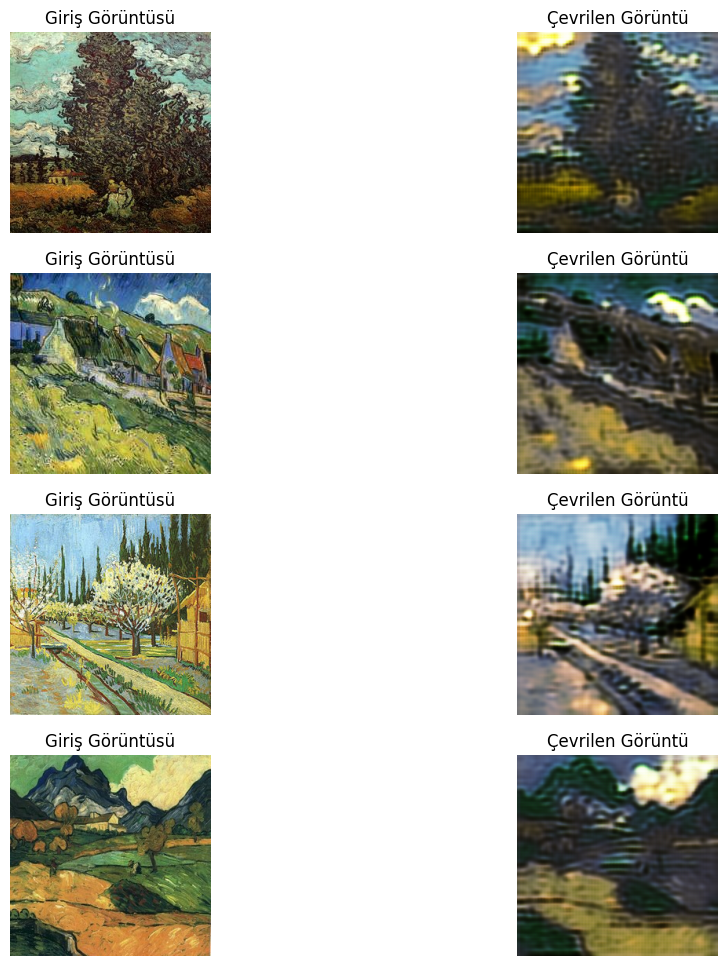

400/400 [==============================] - 324s 653ms/step - G_loss: 4.1348 - F_loss: 4.3410 - D_X_loss: 0.1341 - D_Y_loss: 0.1537
Epoch 2/10
400/400 [==============================] - ETA: 0s - G_loss: 3.8815 - F_loss: 3.8816 - D_X_loss: 0.2164 - D_Y_loss: 0.1851

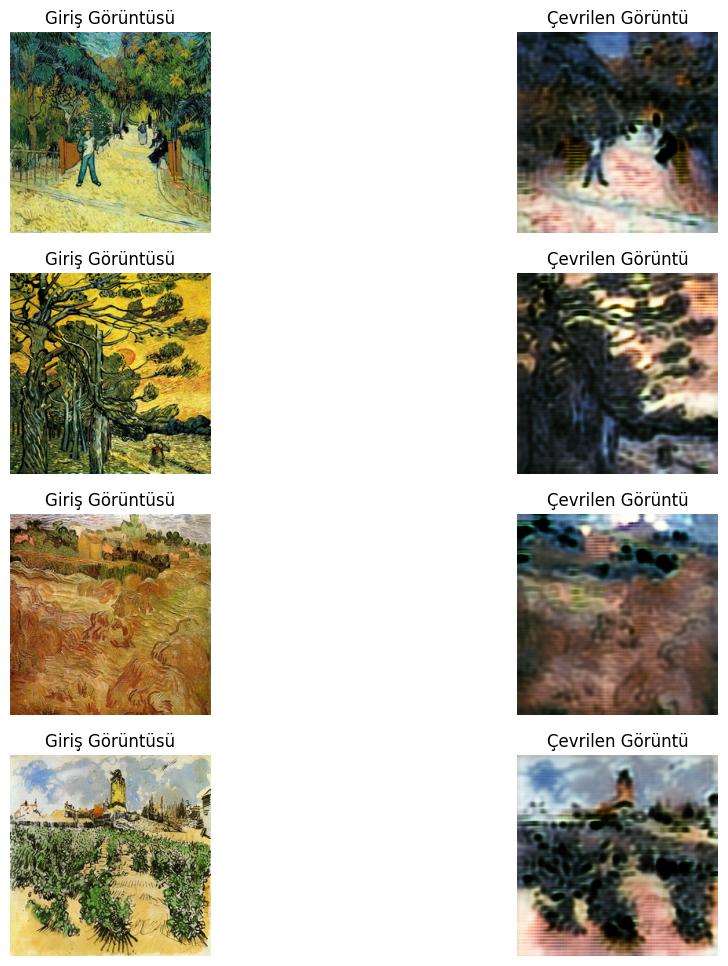

400/400 [==============================] - 258s 645ms/step - G_loss: 3.8834 - F_loss: 3.8894 - D_X_loss: 0.2162 - D_Y_loss: 0.1852
Epoch 3/10
400/400 [==============================] - ETA: 0s - G_loss: 3.7321 - F_loss: 3.6907 - D_X_loss: 0.2052 - D_Y_loss: 0.1848

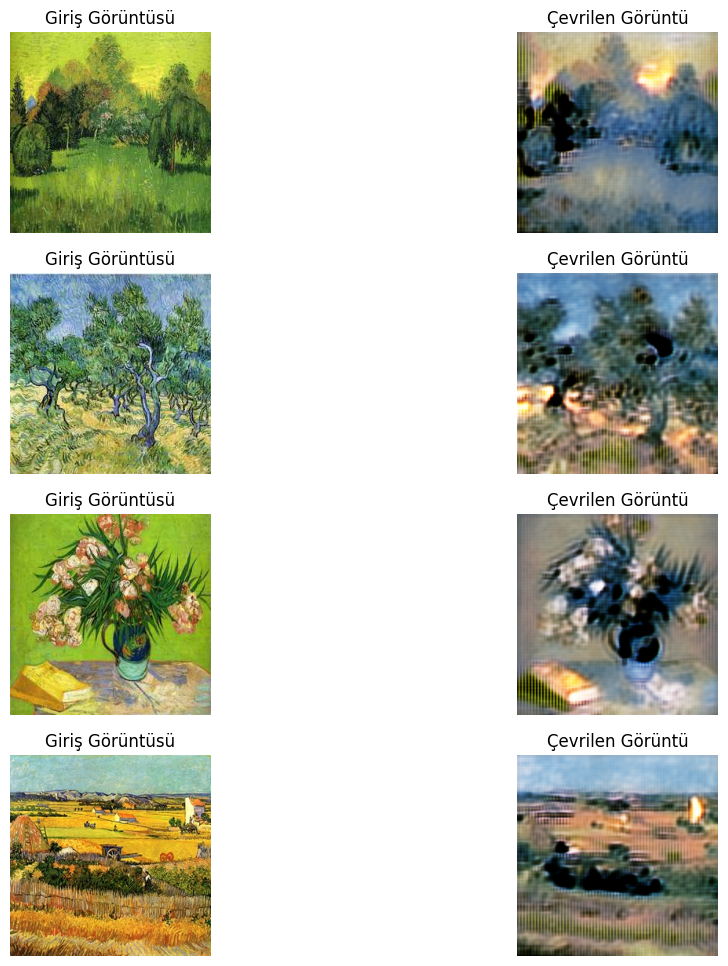

400/400 [==============================] - 259s 646ms/step - G_loss: 3.7302 - F_loss: 3.6893 - D_X_loss: 0.2052 - D_Y_loss: 0.1852
Epoch 4/10
400/400 [==============================] - ETA: 0s - G_loss: 3.6369 - F_loss: 3.6088 - D_X_loss: 0.1996 - D_Y_loss: 0.1790

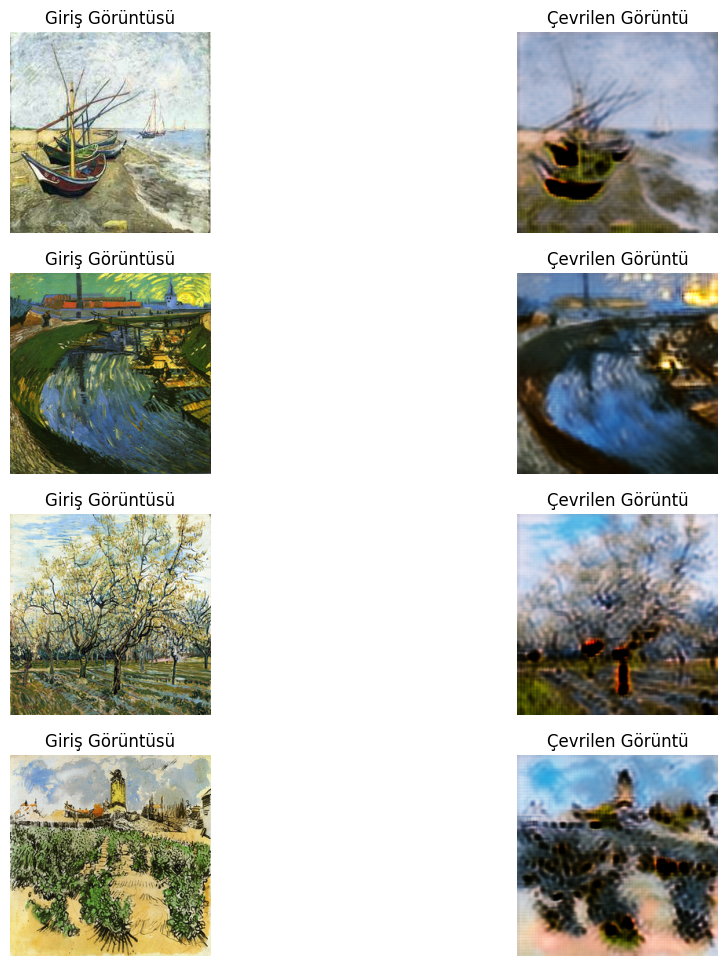

400/400 [==============================] - 262s 653ms/step - G_loss: 3.6383 - F_loss: 3.6075 - D_X_loss: 0.1993 - D_Y_loss: 0.1786
Epoch 5/10
400/400 [==============================] - ETA: 0s - G_loss: 3.5484 - F_loss: 3.5349 - D_X_loss: 0.1878 - D_Y_loss: 0.1715

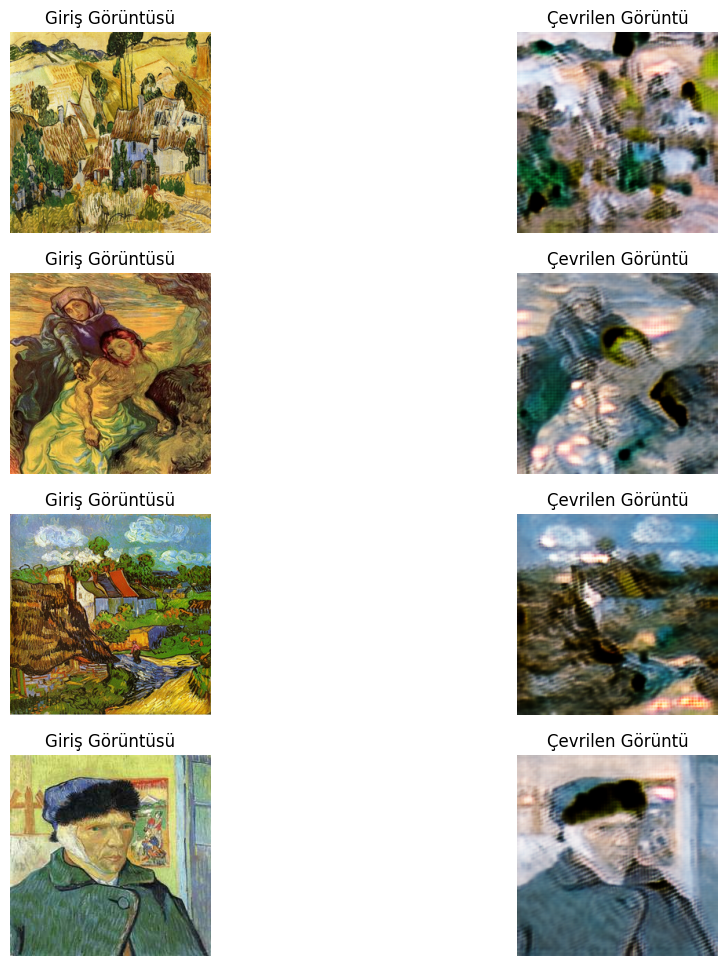

400/400 [==============================] - 262s 652ms/step - G_loss: 3.5474 - F_loss: 3.5354 - D_X_loss: 0.1876 - D_Y_loss: 0.1716
Epoch 6/10
400/400 [==============================] - ETA: 0s - G_loss: 3.4738 - F_loss: 3.4175 - D_X_loss: 0.1895 - D_Y_loss: 0.1764

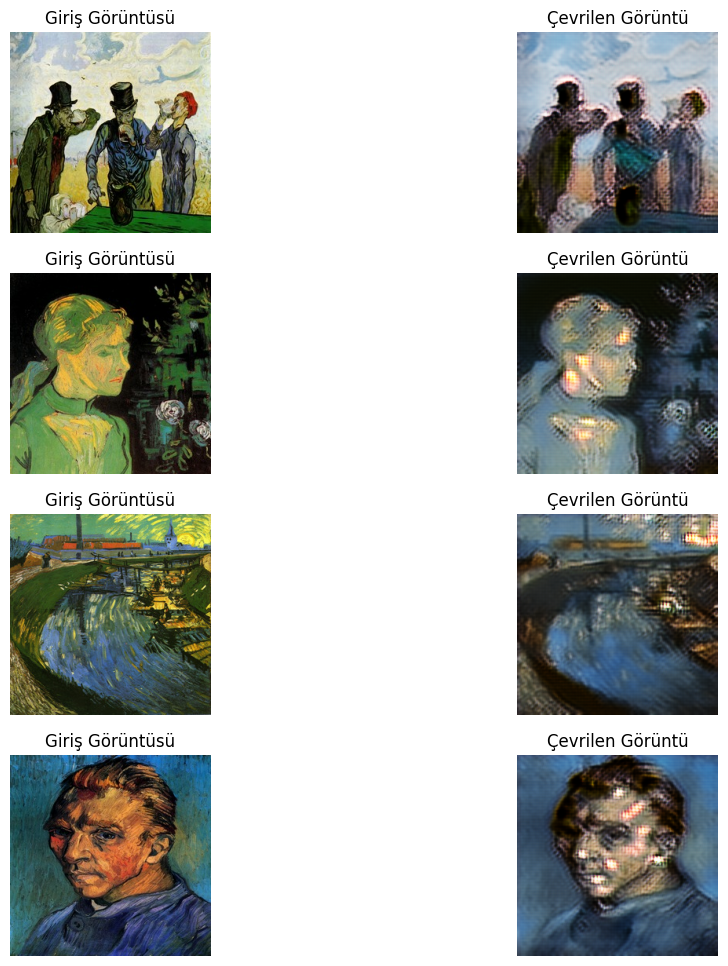

400/400 [==============================] - 261s 652ms/step - G_loss: 3.4751 - F_loss: 3.4164 - D_X_loss: 0.1898 - D_Y_loss: 0.1765
Epoch 7/10
400/400 [==============================] - ETA: 0s - G_loss: 3.5353 - F_loss: 3.3728 - D_X_loss: 0.1929 - D_Y_loss: 0.1701

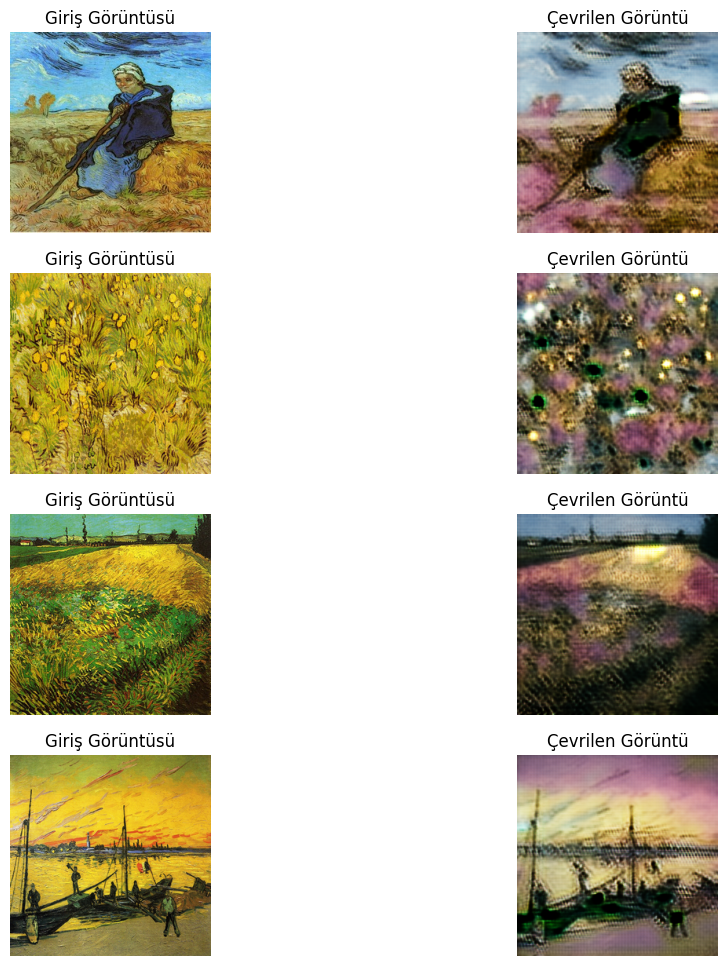

400/400 [==============================] - 261s 652ms/step - G_loss: 3.5326 - F_loss: 3.3727 - D_X_loss: 0.1928 - D_Y_loss: 0.1699
Epoch 8/10
400/400 [==============================] - ETA: 0s - G_loss: 3.3722 - F_loss: 3.2250 - D_X_loss: 0.2022 - D_Y_loss: 0.2004

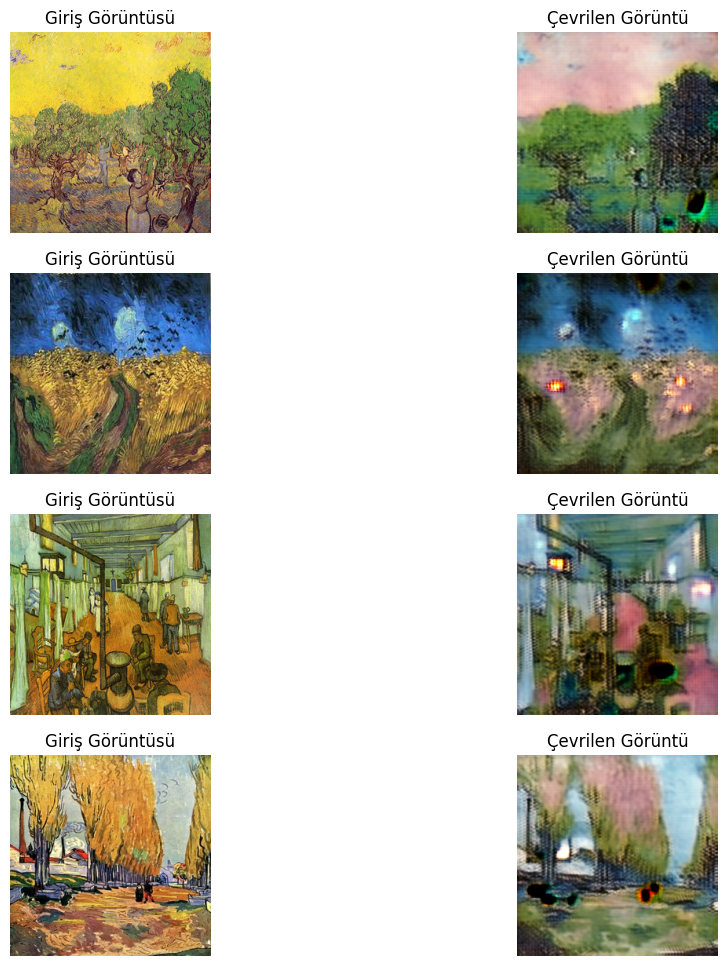

400/400 [==============================] - 260s 648ms/step - G_loss: 3.3719 - F_loss: 3.2253 - D_X_loss: 0.2024 - D_Y_loss: 0.2003
Epoch 9/10
400/400 [==============================] - ETA: 0s - G_loss: 3.3558 - F_loss: 3.2026 - D_X_loss: 0.2072 - D_Y_loss: 0.1982

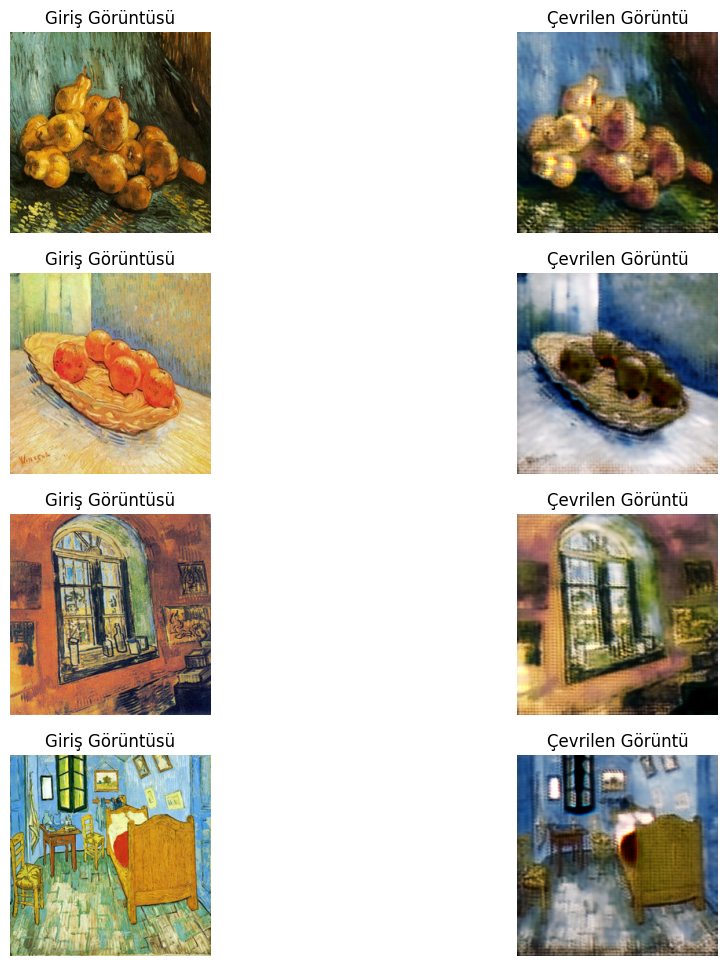

400/400 [==============================] - 261s 652ms/step - G_loss: 3.3548 - F_loss: 3.2039 - D_X_loss: 0.2071 - D_Y_loss: 0.1984
Epoch 10/10
400/400 [==============================] - ETA: 0s - G_loss: 3.3199 - F_loss: 3.1218 - D_X_loss: 0.2080 - D_Y_loss: 0.1967

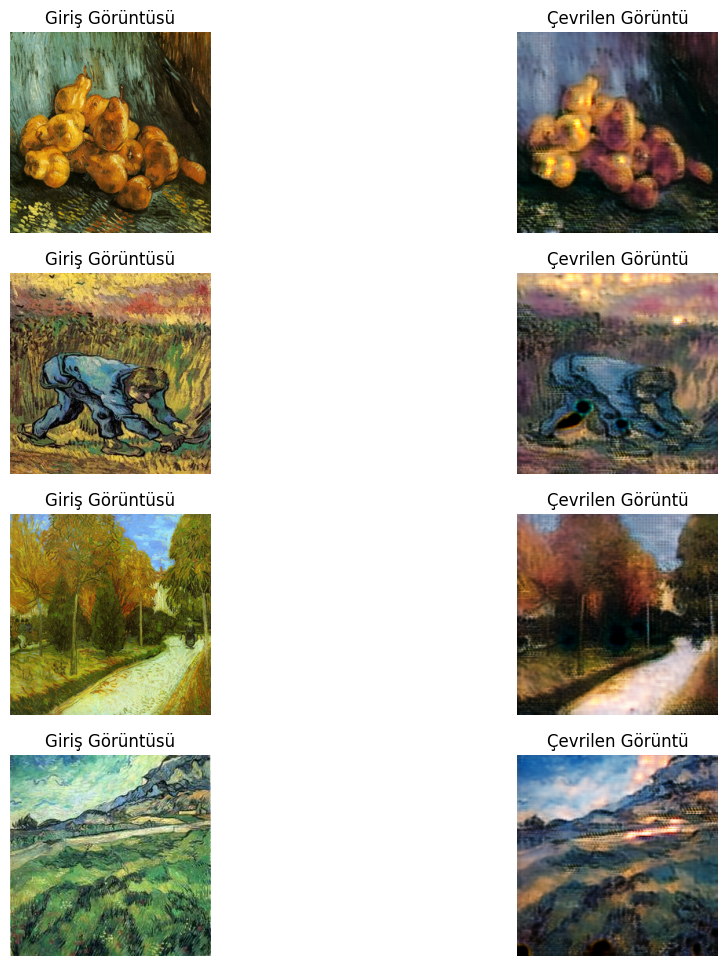

400/400 [==============================] - 263s 656ms/step - G_loss: 3.3174 - F_loss: 3.1214 - D_X_loss: 0.2080 - D_Y_loss: 0.1967


In [13]:
# Adversarial kaybı değerlendirmek için kayıp fonksiyonu
adv_loss_fn = keras.losses.MeanSquaredError()

# Jeneratörler için kayıp fonksiyonunu tanımla
def generator_loss_fn(fake):
    # Sahte görüntüler için kaybı hesapla
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss

# Ayırt ediciler için kayıp fonksiyonunu tanımla
def discriminator_loss_fn(real, fake):
    # Gerçek görüntüler için kaybı hesapla
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    # Sahte görüntüler için kaybı hesapla
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    # Toplam kaybı hesapla ve döndür
    return (real_loss + fake_loss) * 0.5

# Cycle gan modelini oluştur
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Modeli derle
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)

# Callback'ler
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True
)

#Kayıp geçimişi
class LossHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.G_losses = []
        self.F_losses = []
        self.D_X_losses = []
        self.D_Y_losses = []

    def on_batch_end(self, batch, logs={}):
        # Her parti sonunda kayıpları kaydet
        self.G_losses.append(logs.get('G_loss'))
        self.F_losses.append(logs.get('F_loss'))
        self.D_X_losses.append(logs.get('D_X_loss'))
        self.D_Y_losses.append(logs.get('D_Y_loss'))

# Kayıp geçmişi için callback nesnesi oluştur
loss_history = LossHistory()

# Modeli eğit
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_goghs, train_photos)),
    epochs=10,
    callbacks=[plotter, model_checkpoint_callback, loss_history],
)


# Grafikler

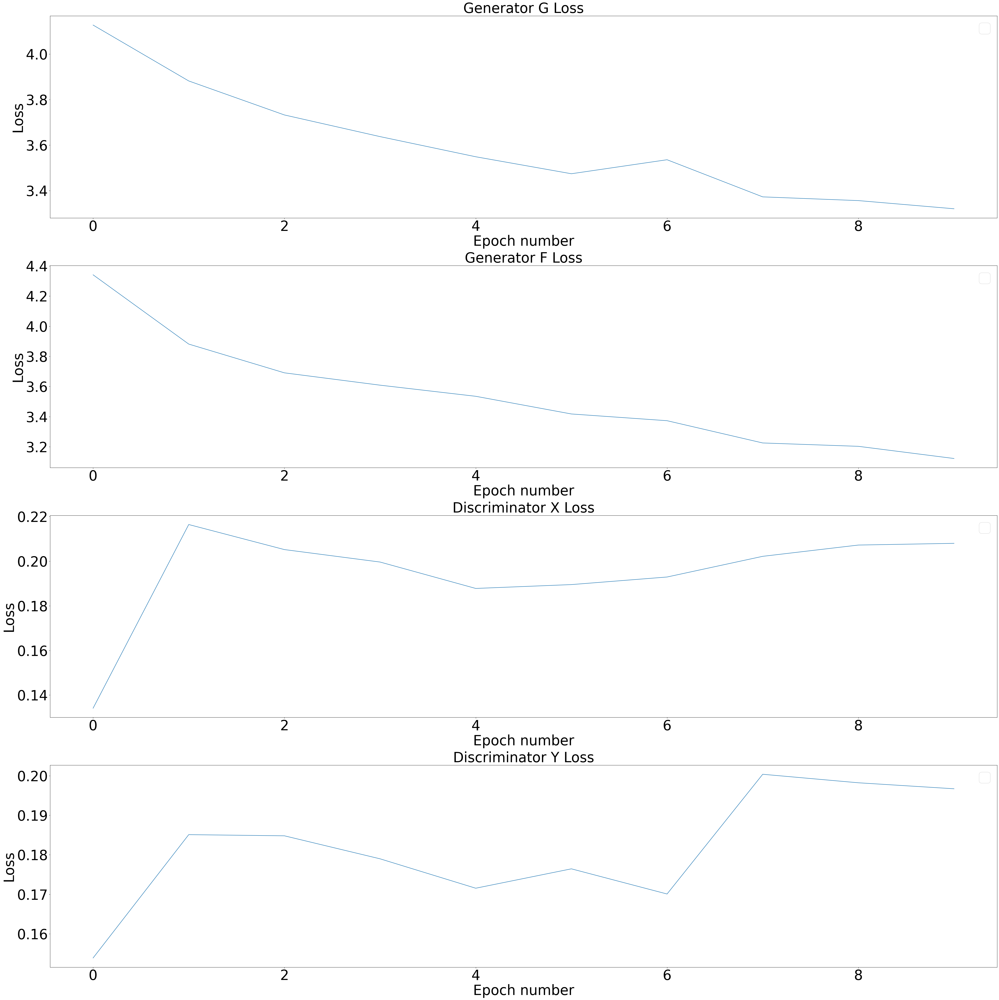

In [14]:
## Hata oranlarının her bir iterasyon adımındaki değerlerine göre grafik olarak görmek için çizilen grafik kodları.
averages_G_losses = np.array([np.mean(loss_history.G_losses[i:i+400]) for i in range(0, len(loss_history.G_losses), 400)])

plt.figure(figsize=(48, 48))
plt.subplot(4, 1, 1)
plt.plot(averages_G_losses)
plt.title('Generator G Loss',fontsize=48)
plt.ylabel('Loss',fontsize=48)
plt.xlabel('Epoch number',fontsize=48)
plt.legend(fontsize=48)
plt.tick_params(labelsize=48)

averages_F_losses = np.array([np.mean(loss_history.F_losses[i:i+400]) for i in range(0, len(loss_history.F_losses), 400)])

plt.subplot(4, 1, 2)
plt.plot(averages_F_losses)
plt.title('Generator F Loss',fontsize=48)
plt.ylabel('Loss',fontsize=48)
plt.xlabel('Epoch number',fontsize=48)
plt.legend(fontsize=48)
plt.tick_params(labelsize=48)

averages_D_X_losses = np.array([np.mean(loss_history.D_X_losses[i:i+400]) for i in range(0, len(loss_history.D_X_losses), 400)])

plt.subplot(4, 1, 3)
plt.plot(averages_D_X_losses)
plt.title('Discriminator X Loss',fontsize=48)
plt.ylabel('Loss',fontsize=48)
plt.xlabel('Epoch number',fontsize=48)
plt.legend(fontsize=48)
plt.tick_params(labelsize=48)

averages_D_Y_losses = np.array([np.mean(loss_history.D_Y_losses[i:i+400]) for i in range(0, len(loss_history.D_Y_losses), 400)])

plt.subplot(4, 1, 4)
plt.plot(averages_D_Y_losses)
plt.title('Discriminator Y Loss',fontsize=48)
plt.ylabel('Loss',fontsize=48)
plt.xlabel('Epoch number',fontsize=48)
plt.legend(fontsize=48)
plt.tick_params(labelsize=48)

plt.tight_layout()
plt.show()
